# Keras

Keras, Python'da yazılmış açık kaynaklı bir sinir ağı kütüphanesidir. Keras TensorFlow, Microsoft Cognitive Toolkit, R, Theano veya PlaidML ile beraber çalışabilir. ONEIROS (Açık Uçlu Nöro-Elektronik Akıllı Robot İşletim Sistemi), projesinin araştırma çabalarının bir parçası olarak geliştirilmiştir ve ana yazarı ve sürdürücüsü Google mühendisi François Chollet'tir. Chollet ayrıca XCeption derin sinir ağı modelinin yazarıdır.

2017 yılında Google'ın TensorFlow ekibi, TensorFlow'un çekirdek kütüphanesinde Keras'ı desteklemeye karar verdi. Chollet, Keras'ın bağımsız bir makine öğrenimi çerçevesi yerine bir arayüz olarak tasarlandığını açıkladı. Kullanılan hesaplamalı arka uçtan bağımsız olarak derin öğrenme modelleri geliştirmeyi kolaylaştıran daha üst düzey, daha sezgisel bir soyutlama seti sunar. Microsoft, CNTK v2.0'dan itibaren mevcut olan Keras'a bir CNTK arka ucu ekledi.

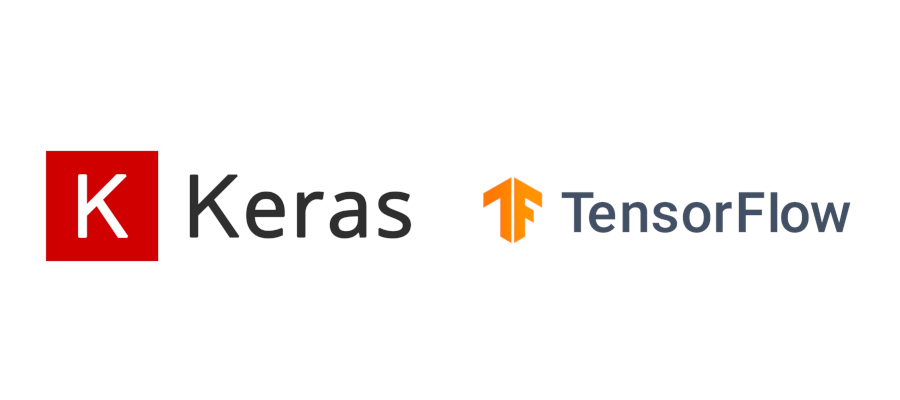

In [1]:
# TensorFlow üzerinden keras modülünü çağırmak.

import tensorflow

tensorflow.keras.layers.Conv2D(32, (3,3), activation="relu", input_shape=(150,150,3))

# Uygulamaya başlamadan önce

Yapacağım sunumda, örnek bir projeden ilerleyeceğiz.
örnek projede ikili sınıflandırma problemi çözeceğiz (Maske var yada yok)
insanların kontrol noktalarında maske takıp takmadıklarını kontrol edeceğiz.

Modelimizi bu doğrultuda geliştireceğiz. 


# Veri seti

Veri (İng. ve Lat. datum; ç. data), ham (işlenmemiş) gerçek enformasyon parçacığına verilen addır.[1] Veriler ölçüm, sayım, deney, gözlem ya da araştırma yolu ile elde edilmektedir.


Veri seti elde edilebilecek kaynaklar :

1-) Kaggle (Çeşitli veriler)

2-) bioRxiv (Sağlık verileri)

3-) medRxiv (Sağlık verileri)

4-) Google Dataset Search (Veri arama motoru)

Modelimizde kullanıdığımız veri seti = https://www.kaggle.com/ahmetfurkandemr/mask-datasets-v1

# Gerekli modüller

In [2]:
# Modelimizin görsel halini diske kaydetmek.
from keras.utils import plot_model 

# Xception Öneğitimli Evrişimli Sinir Ağı 
from keras.applications import xception

# veri çeşitlendirme
from keras.preprocessing.image import ImageDataGenerator

# eniyileme
from keras import optimizers

# model tanımlamak
from keras.models import Sequential

# çıktı boyutunu düzenleme
from keras.layers import Flatten

# tamamen bağlı katman
from keras.layers import Dense

# iletim sönümü
from keras.layers import Dropout

# kayıpları ve başarımı görselleştirme
import matplotlib.pyplot as plt

from time import sleep as sl

# matris işlemleri
import numpy as np

# klasör ve işletim sistemi
import os, shutil

# keras
import keras

# Yığın normalleştirme
from keras.layers import BatchNormalization

Using TensorFlow backend.


# Adım adım veri ön işleme

### Veri yollarını koda tanımlamak

In [3]:
# eğitim veri seti klasörü
train_dir = os.path.join("Train") 


# Doğrulama veri seti klasörü
validation_dir = os.path.join("Validation")


# Eğitim veri setinde maske takan isnan verileri
train_mask_dir = os.path.join(train_dir,"Mask") 


# Eğitim veri setinde maske takmayan insan verileri
train_no_mask_dir = os.path.join(train_dir,"No_mask")


# Doğrulama veri setinde maske takan isnan verileri
validation_mask_dir = os.path.join(validation_dir,"Mask")


# Doğrulama veri setinde maske takmayan insan verileri
validation_no_mask_dir = os.path.join(validation_dir,"No_mask")

### Eğitim veri seti çeşitlendirme

Eğer elimizde yeterli kadar veri yoksa, veriler üzerinde oynama yaparak yeni veriler türetiriz.
(Veri setimizde 1100 adet maske verisi bize az geldiğinden dolayı çeşitlendirme yapacağız.)

In [4]:
train_datagen = ImageDataGenerator(

      # resim pixellerini 0,1 arasına sıkıştırma
      # RGB(0,255) to RGB(0,1)
      rescale=1./255,

      # derece cinsinden (0-180) resimlerin rastgele döndürülme açısı
      rotation_range=40,

      # resimlerin yatayda ve dikeyde kaydırılma oranları
      width_shift_range=0.2,

      # resimlerin yatayda ve dikeyde kaydırılma oranları
      height_shift_range=0.2,

      # burkma işlemi
      shear_range=0.2,

      # yakınlaştırma işlemi
      zoom_range=0.2,

      # dikeyde resim döndürme
      horizontal_flip=True,

      # işlemlerden sonra ortaya çıkan  fazla 
      # görüntü noktalarının nasıl doldurulacağını belirler
      # varsayılan 'nearset'
      # 'nearest': aaaaaaaa|abcd|dddddddd
      # en yakın pixele göre doldurma.
      fill_mode='nearest')

      # 'constant': kkkkkkkk|abcd|kkkkkkkk (cval=k), sabite göre doldurma yapar.
      # 'reflect': abcddcba|abcd|dcbaabcd , Pixellerde yansıtma yapar.

### Çeşitlendirilmiş verileri inceleme

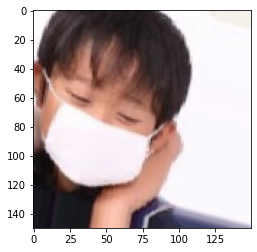

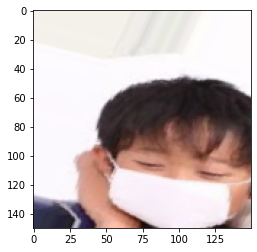

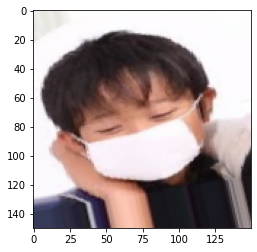

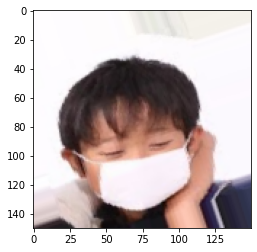

In [5]:
from keras.preprocessing import image

fnames = [os.path.join(validation_mask_dir, fname) for fname in os.listdir(validation_mask_dir)]

# çeşitlendirme yapacağımız herhangi bir resim
img_path = fnames[3]

# resmi alır ve yeniden boyutlandırır
img = image.load_img(img_path, target_size=(150, 150))

# (150, 150, 3) şeklinde numpy dizisine çevirir
x = image.img_to_array(img)

# (1, 150, 150, 3) haline getirir
x = x.reshape((1,) + x.shape)

i = 0
for batch in train_datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break

plt.show()

### Doğrulama verilerinde çeşitlendirme yapmıyoruz.

Resimdeki RGB değerlerini (0,255) değerleri arasına sıkıştırmak yerine (0,1) arasına sıkıştırıyoruz.
Bu sayede tensör işlemlerinde hız kazanmış olacağız.


In [6]:
test_datagen = ImageDataGenerator(rescale=1./255)

### Veri tensörleri oluşturma (Oluşturduğumuz ImageDataGenerator kullanarak)

In [7]:
# çeşitlendirilmiş verileri kullanmak (eğitim)
train_generator = train_datagen.flow_from_directory(

        # hedef dizin
        train_dir,

        # tüm resimler (150x150) olarak boyutlandırılacak
        target_size=(150, 150),

        # yığın boyutu
        batch_size=128,
        
        # ikili sınıfllandırmaya göre
        # binary_crossentropy (loss fonksiyonu) kullandığımız için
        # ikili etiketler gerekiyor.
        class_mode='binary')
        # 'categorical' yaparsak iki sınıftan fazla olması gerekli (çoklu sınıflandırma)
    

Found 750 images belonging to 2 classes.


In [8]:
# verileri kullanmak (doğrulama)
validation_generator = test_datagen.flow_from_directory(

        validation_dir,

        target_size=(150, 150),

        batch_size=64,

        class_mode='binary')

Found 350 images belonging to 2 classes.


## Neden RGB değerleri (0,1) arasına sıkıştırıyoruz?

Resimlerin RGB değerlerini (0,1) arasına sıkıştırarak büyük sayılarla uğraşmaktan kurtuluyoruz,
Tensör ve gradyan hesaplamalarına daha az güç ayırıyoruz.

## Neden resimleri (150,150,3) veya (150,150,1) olarak yeniden boyutlandırıyoruz ?

Resimlerin (150,150,3) olarak şekillendirmemizin sebebi ise tüm resimlerin aynı boyutta olmasını sağlamak,
Veri setinde çok büyük boyutlu resimler varsa gereksiz güç harcamayı önlemek ve
CNN katmanımızın aldığı input_shape ile aynı olması için yeniden boyutlandırıyoruz.

### Eğer bu işlemleri yapmazsak

Cpu/Gpu yu gerksiz bir şekilde yorarız veya Verileri depolayan random memory access(Ram) gereksiz doluluk sağlarız.

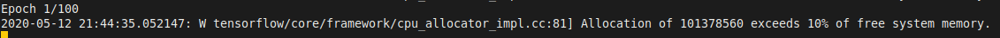

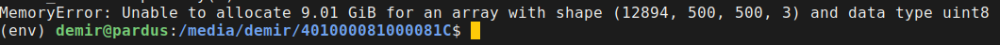

# Model inşa etmek

In [9]:
# basit bir model inşaası

modela = Sequential()

modela.add(Dense(32, activation="relu",input_shape=(16,)))
modela.add(Dense(32, activation="relu"))

Dikkat edilmesi gereken ilk şey Sequential () yönteminin kullanılmasıdır. 
Bu bize bir katman zinciri oluşturmak için olanak sağlar. 
Ekleyeceğimiz katmanlar sırayla arka arkaya geçerler.
modelimizi daha mantıklı düzenleme ve kullanmak için gereklidir.

Model.add() şeklinde modelimize katmanlar ekleyebiliriz.

# Evrişimli Sinir Ağları

Geleneksel bir CNN (Evrişimli Sinir Ağı) mimarisi ― CNN'ler olarak da bilinen evrişimli sinir ağları, genellikle aşağıdaki katmanlardan oluşan belirli bir tür sinir ağıdır:

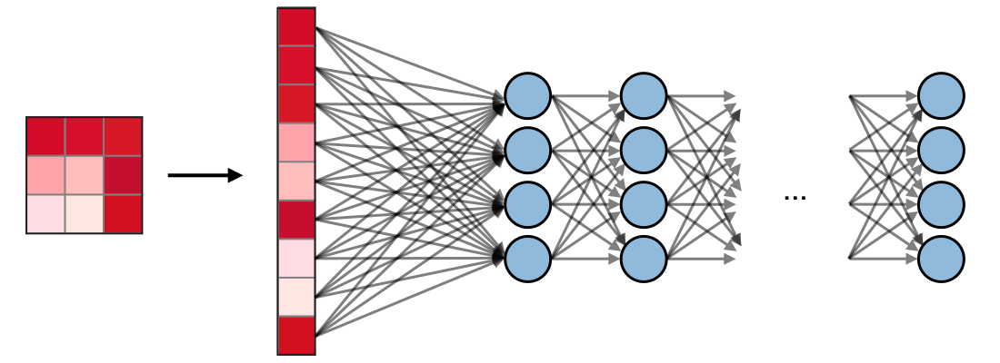

## Katman tipleri

Evrişim katmanı (CONV) evrişim işlemlerini gerçekleştiren filtreleri,I
Girişini boyutlarına göre tararken kullanır. Hiperparametreleri F
Filtre boyutunu ve S adımını içerir. Elde edilen çıktı, 
Öznitelik haritası veya aktivasyon haritası olarak adlandırılır.

![ChessUrl](https://stanford.edu/~shervine/teaching/cs-230/illustrations/convolution-layer-a.png "chess")

## Ortaklama (POOL) 

Ortaklama katmanı (POOL), tipik olarak bir miktar uzamsal değişkenlik gösteren bir evrişim katmanından sonra uygulanan bir örnekleme işlemidir. Özellikle, maksimum ve ortalama ortaklama, sırasıyla maksimum ve ortalama değerin alındığı özel ortaklama türleridir.


### Maksimum ortaklama

![ChessUrl](https://stanford.edu/~shervine/teaching/cs-230/illustrations/max-pooling-a.png "chess")


### Ortalama ortaklama

![ChessUrl](https://stanford.edu/~shervine/teaching/cs-230/illustrations/average-pooling-a.png "chess")


## Tam Bağlantı (FC)

Tam bağlı katman (FC), her girişin tüm nöronlara bağlı olduğu bir giriş üzerinde çalışır. Eğer varsa, FC katmanları genellikle CNN mimarisinin sonuna doğru bulunur ve sınıf skorları gibi hedefleri optimize etmek için kullanılabilir.

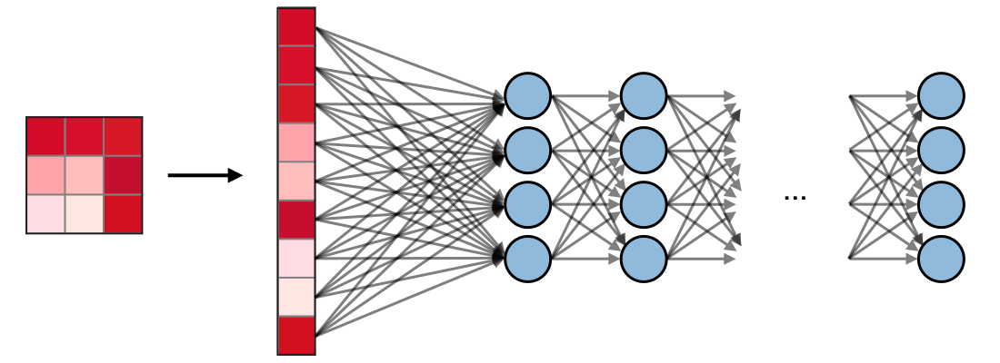

### Evrişimli sinir ağları ile ile ilgili ilginç nitelikler

* Öğrendikleri örüntüler yön değişmezdir: Bir resmin sol alt köşesinde öğrendiği bir örüntüyü her yerde tanıyabilir. Tamamen bağlı ağlarda farklı bir bölgede aynı örüntü ile karşılaştığında bunu da yeniden öğrenmesi gerekmektedir.


* Örüntüler uzamsal hiyerarşileri öğrenebilirler: ilk evrişimli katman köşeler gibi küçük bölgesel örüntüleri öğrenirken ikinci evrişimli katman ilk katmanın öğrendiği örüntülerden daha geniş örüntüler öğrenir ve bu böyle devam eder.


* inceleyin = https://github.com/AhmetFurkanDEMIR/To-visualize-what-Evolutionary-Neural-Networks-have-learned

# Keras ‘ta CNN (Convolutional Neural Network) katmanı oluşturmak

![ChessUrl](https://miro.medium.com/max/960/0*ltwScVZ6JNa5Tl1H "chess")

In [10]:
from keras.layers import Conv2D # Kerasta Convolutional Neural Network katmanı oluşturmak için gerekli modül.

In [11]:
model = Sequential()
model.add(Conv2D(32, (3,3), activation="relu", input_shape=(150,150,3)))

Evrişimli sinir ağları (image_height, image_width, image_chanel) şeklinde
Girdiler bekler.

Bizim örneğimizde girdiler (150,150,3) şeklinde olacaktır.

### CNN katmanını aldığı parametreler:

Katmandaki gizli birim boyutu (32)

Resimler üzerinde gezinecek filtre boyutu (3,3)

Aktivasyon fonksiyonu "relu"

İşlemlerden geçirilecek girdi(tensör) boyutu (ilk katman) (150,150,3)

Adım aralığı, varsayılan değer = 1 

### CNN katmanlarıdan oluşmuş model.

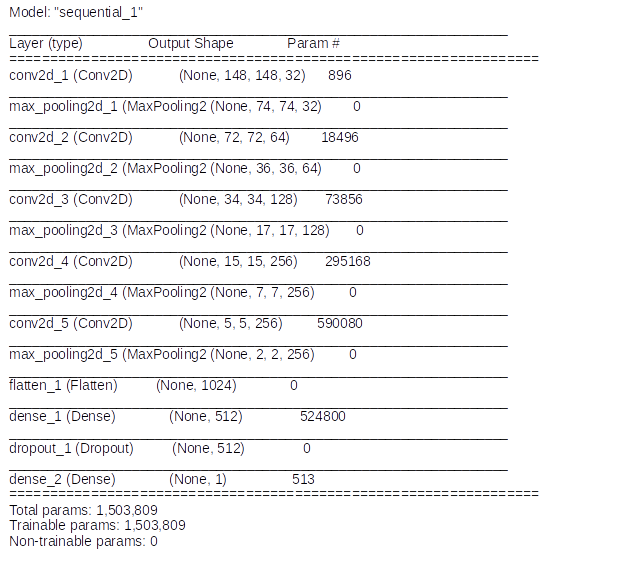

Model de bulunan max pooling, flatten, Dense, dropout ve ayrıca BatchNormalization gibi katmanlarını inceleyeceğiz.

### Max pooling:

Parametre sayısını azaltmak için max pooling kullanırız.

en büyükleri biriktirmek.

her MaxPooling katmanından sonra nitelik haritalarının boyutu yarıya düşer.

girdi nitelik haritasından pencereler çıkarıp her kanalın en büyük değerini almaktır. 

Her aktivasyon haritası için ayrı ayrı uygularız (Derinliği etkilemez.)

Filitrelemedeki en büyük değeri alır.

Söz dizimi : model.add(MaxPooling2D(2,2))

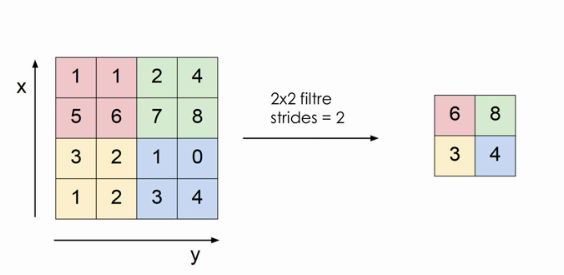

### Dropout

iletim sönümü : 

modelin aşırı uydurma yapmasını engeller.

Sinir ağlarının düzleştirilmesinde kullanılır.

verdiğimiz orana göre bazı elemanları sıfırlar.

Söz dizimi : model.add(Dropout(0.6))

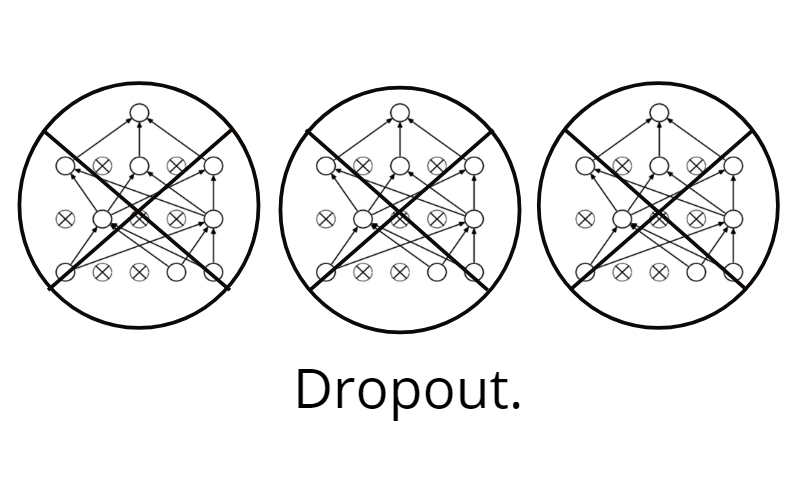

### BatchNormalization :

Yığın normalleştirme

modelin daha iyi geneleştirme yapmasını sağlar.

eğitim süresince  verinin ortalaması ve standart sapmasının değişimlerine bakarak veriyi normalize eder. 

Söz dizimi : model.add(BatchNormalization())

Evrişimli sinir ağlarından sonraki katmana eklenir, Flatten katmanından önce

### Flatten:

3B çıktıları 1B vektörlere düzenler

Söz dizimi : model.add(Flatten())


### Dense:

Tamamen bağlı katman

Son katman fonksiyonunu sigmoid olarak kullanarak çıkan değeri [0,1] arasına sıkıştırdık
çünkü ikili sınıflandırma var. (MASK, NO MASK)

Söz dizimi : model.add(Dense(256, activation="relu"))

# Öneğitimli CNN

Öneğitimli ağ daha önce büyük bir veri setinde genellikle de büyük ölçekli resim sınıflandırma
Görevinde eğitilip kaydedilmiş ağdır.

Biz bu uygulamamızda Xception öneğitimli CNN kullanacağız.
Bu öneğitimli CNN. ImageNet(Sınıfların çoğu hayvanlar ve günlük hayatta kullandığımız 
nesnelerdir.) veri seti ile eğitilmiştir.

artık bağlantı Xception da dahil 2015 sonrasında birçok modelde kullanılan
bir diğer çizgisel ağ yapısıdır. 2015 sonlarında ILSVRC ImageNet yarışmasını kazanan
Microsoft 'tan He vd. tarıfından geliştirilmiştir.
Modelleri her büyük çaplı derin öğrenme modelinin başının belası olan iki yaygın problemle mücadele ediyor:
Gradyan yok olması ve gösterimsel darboğaz


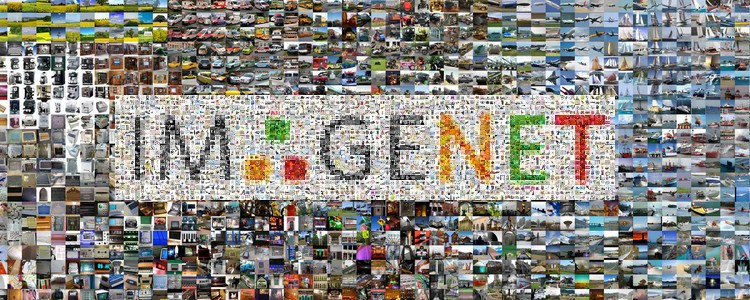

In [12]:
# Xception Öneğitimli Evrişimli Sinir Ağı modülü
from keras.applications import xception

## Diğer Öneğitimli modeller

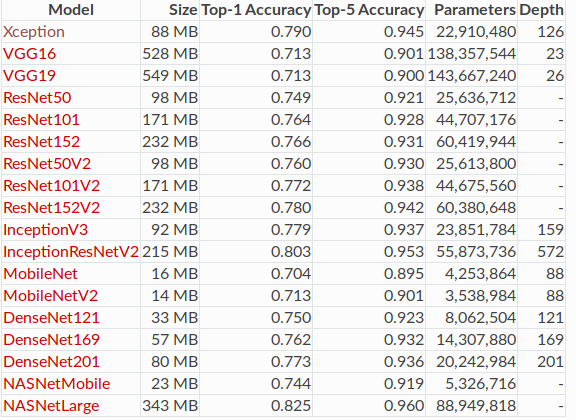

In [13]:
conv_base = xception.Xception(weights="imagenet", include_top=False, input_shape=(150,150,3))

Weights = Modelin başlatılacağı kontrol noktasını belirler

include_top = tamamen bağlı katmanların dahil olup olmamasını kontrol eder. 
(ön tanımlı olan tamamen bağlı katmanlar ImageNet’teki 1000 sınıf içindir, 
biz kendi sınıflandırmamızı yapan tamamen bağlı katmanlar eğiteceğiz.)

input_shape = ağı besleyeceğiniz tensörün şeklini belirler.

In [14]:
# Xception ön eğitimli modelin katmanları

print(conv_base.summary())

Model: "xception"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 150, 150, 3)  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 74, 74, 32)   864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 74, 74, 32)   128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 74, 74, 32)   0           block1_conv1_bn[0][0]            
___________________________________________________________________________________________

# Ön eğitimli ağın bazı katmanlarını dondurma işlemi

Öneğitimli Evrişimli Sinir Ağındaki bazı katmanlar haricinde diğer tüm katmanları donduruyoruz.
Dondurma sebebimiz ise parametre sayısı çok fazla olunca fazla işlem kapasitesi demektir.
Dondurma sebebimiz Dense katmanları rastgele başlatıldığından eğitim esnasnında çok büyük güncellemeler 
alacaktır ve buda daha önce öğrenilen gösterimleri yok edecektir.
Bu haliyle sadece block14_sepconv1 katmanın ve sonraki katmanların ağırlıkları güncellenecek.

In [15]:
conv_base.trainable = True

set_trainable = False

for layer in conv_base.layers:
    
    # "block14_sepconv1" katmanı ve sonraki katmanların
    # öğrenebilmesine olanak sağlar.
    if layer.name == "block14_sepconv1":  

        set_trainable = True

    if set_trainable:

        layer.trainable = True

    else:

        layer.trainable = False

### Öneğitimli CNN de öğrenebilecek katmanların listesi.

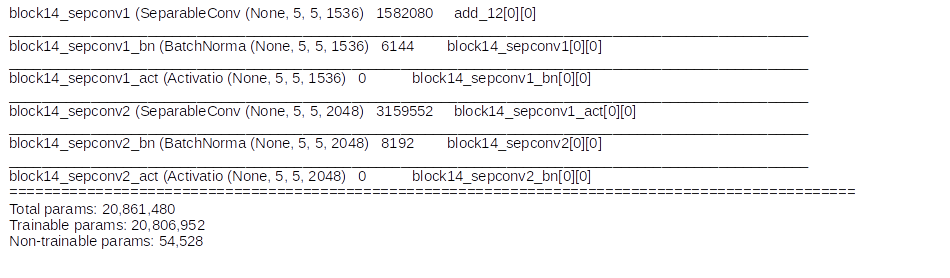

### Mask detection da kullandığımız ağ

In [16]:
# model
model = Sequential()

# modelimize Xception Öneğitimli Evrişimli Sinir Ağını ekledik
model.add(conv_base)

# Yığın normalleştirme
# modelin daha iyi geneleştirme yapmasını sağlar.
# eğitim süresince  verinin ortalaması ve standart sapmasının değişimlerine bakarak veriyi normalize eder. 
model.add(BatchNormalization())

# 3B çıktıları 1B vektörlere düzenler
model.add(Flatten())

# tamamen bağlı katmanlar
model.add(Dense(256, activation="relu"))

# iletim sönümü : 
# modelin aşırı uydurma yapmasını engeller.
# Sinir ağlarının düzleştirilmesinde kullanılır.
# verdiğimiz orana göre elemanları sıfırlar.
model.add(Dropout(0.6))

# fonksiyonu sigmoid olarak kullanarak çıkan değeri [0,1] arasına sıkıştırdık
# çünki ikili sınıflandırma var (MASK, NO MASK)
model.add(Dense(1, activation="sigmoid"))


# modelimizi görüntülemek
print(model.summary())

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 5, 5, 2048)        20861480  
_________________________________________________________________
batch_normalization_5 (Batch (None, 5, 5, 2048)        8192      
_________________________________________________________________
flatten_1 (Flatten)          (None, 51200)             0         
_________________________________________________________________
dense_3 (Dense)              (None, 256)               13107456  
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 257       
Total params: 33,977,385
Trainable params: 17,860,609
Non-trainable params: 16,116,776
_________________________________

# Modeli derleme işlemi

In [17]:
model.compile(loss="binary_crossentropy", # kayıp fonksiyonu

              # eniyileme:
              # ağımızın girdisi olan veri ile oluşturduğu kaybı göz önünde
              # bulundurarak kendisini güncelleme mekanizması
              optimizer=optimizers.RMSprop(lr=2e-5),

              # eğitim ve test süresince takip edilecek metrikler. 
              metrics=["acc"])

Model katmanlarında yapılan önemli değişikliklerden sonra modeli derlemeliyiz.

## Loss(Kayıp) fonksiyonu

* Tahmin edilen y_pred ile hedef y'ler arasındaki farkı bularak kayıp değerini o yığın için hesaplanır.

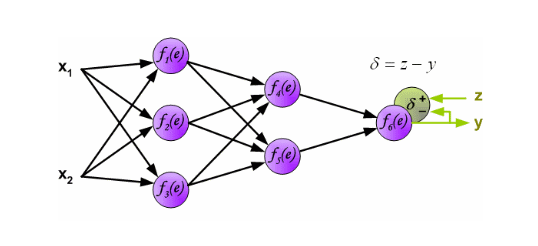

### Modeldeki Aktivasyon fonksiyonu ve kayıp fonksiyonu seçerken ufak bir ipucu

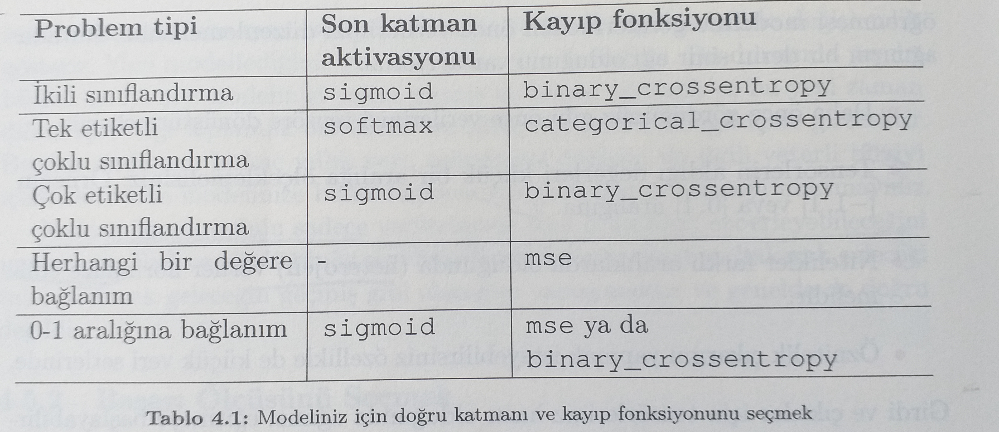

## Optimizers (Eniyileme)

* Eğitim örneklerinden x'ler ve bu örneklere karşılık gelen hedefler olan y'lerden oluşan bir yığın oluşturun.
* Ağı x'lerden tahminler olan y_pred'leri elde etmek için ileri yayılma tabi tutun
* Ağın parametrelerine göre kaybın gradyanını hesapla (geriye yayılım)
* W -= step*gadient işlemini kullanarak yığın için kayıp değerini bir miktar azaltacak şekilde gradyanın tersi yönünde parametreleri güncelle. 

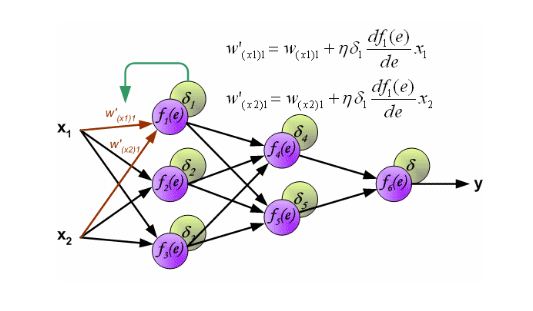

#### Optimizers (Eniyileme) algoritmaları

* SGD
* RMSprop
* Adam
* Adadelta
* Adagrad
* Adamax
* Nadam
* Ftrl

In [ ]:
# modelin görsel halini diske kaydetme

plot_model(model, show_shapes=True, to_file="model/model.png")

# Modelin hangi donanım üzerinde eğitileceğine karar vermek.

Biz bu projemizde modeli NVIDIA GeForce GTX 1060 6GB
GPU üzerinden eğittik

In [61]:
# tensrflow ve kerasın GPU versiyonu gerekli
# Nvdia GPU
# CUDA
# cuDNN
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"

# cpu üzerinden eğitimi gerçekleştirmek isterseniz "-1" yapın
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

#### Nvidia web sitesinden alıntı
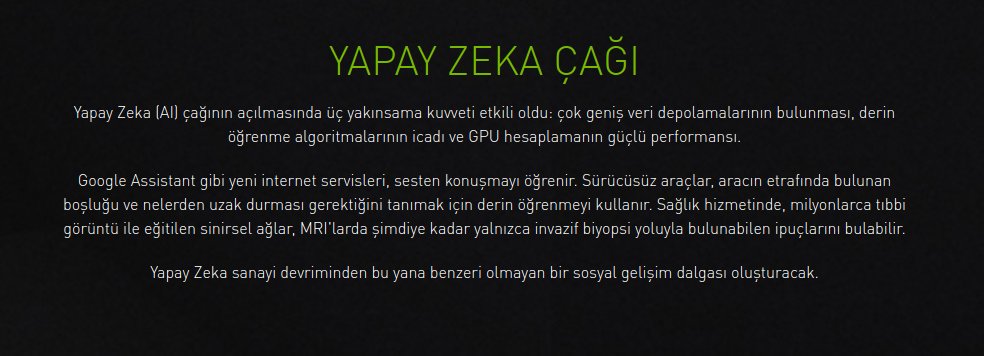

# Modeli Eğitme İşlemi

### Üç yöntem ile kurduğunuz ağları eğitebilirsiniz:

  
#### 1-) .fit: 

* Söz dizimi = model.fit(trainX, trainY, batch_size=32, epochs=50)
  
  
* Burada verilerimiz(X) ve etiketlerini modele 32 lik yığınlarla vererek 50 döngüde eğitim gerçekleştiriyotuz.    .Fit çağrısı burada iki temel varsayımda bulunuyor:


* Tüm eğitim setimiz RAM'e sığabilir ve
Veri artırımı yapılmamaktadır (yani Keras jeneratörlerine gerek yoktur)


* Küçük, basit veri kümeleri için Keras'ın .fit işlevini kullanmak daha mantıklıdır.
    
#### 2-) .fit_generator

* Bu modelde kullandığımız yöntemdir, söz dizimi hemen aşağıdadır.


* Gerçek dünyadaki veri kümeleri genellikle belleğe sığmayacak kadar büyüktür.


* Aynı zamanda zorlayıcı olma eğilimindedirler, aşırı takılmayı önlemek ve modelimizin genelleme yeteneğini artırmak için veri artırımı yapmamızı gerektirir.Bu gibi durumlarda Keras’ın .fit_generator işlevini kullanmamız gerekir
  

* Keras, .fit_generator öğesine sağlanan jeneratör işlevini çağırır. Jeneratör işlevi, .fit_generator işlevine X boyutunda bir parti verir. .Fit_generator işlevi, veri yığınını kabul eder, geri yayılım gerçekleştirir ve modelimizdeki ağırlıkları günceller. Bu süreç, istenen sayıda çağa ulaşana kadar tekrarlanır.
  
#### 3-) .train_on_batch

* Söz dizimi = model.train_on_batch(batchX, batchY)


* Train_on_batch işlevi tek bir veri kümesini kabul eder, geriye yayılımı gerçekleştirir ve sonra model parametrelerini güncelleştirir.


* Veri grubu keyfi boyutta olabilir


* Veri yineleme işleminin son derece karmaşık olması ve özel kod gerektirmesi gibi kendi egzersiz verileri yineleyicinizi korumak istemeniz için çok açık nedenleriniz olduğunda genellikle .train_on_batch işlevini kullanırsınız.


* Durumların% 99'unda derin öğrenme modellerinizi eğitmek üzerinde bu kadar hassas bir kontrole ihtiyacınız olmayacak. Bunun yerine, ihtiyacınız olan tek şey özel bir Keras .fit_generator işlevi olabilir.


### Veri arıtımı nedir ?

* Veri artırımı uygulamak, eğitim verilerimizin artık “statik” olmadığı anlamına gelir - veriler sürekli olarak değişmektedir.


* Her yeni veri grubu, ImageDataGenerator ürününe sağlanan parametrelere göre rastgele ayarlanır.


In [ ]:
history = model.fit_generator( # acc, loss, val_acc, val_loss değerlerini history adlı değişkenden alacağız.

      # eğitim verileri
      train_generator,

      # döngü bitene kadar geçeceği örnek sayısı (alınacak yığın)
      steps_per_epoch=128,

      # döngü sayısı
      epochs=100,

      # doğrulama verisi
      validation_data=validation_generator,

      # doğrulama için yığın sayısı
      validation_steps=64,
    
      # ayrıntı modunu belirler (0 = sessiz, 1 = ilerleme çubuğu, 2 = çağ başına bir satır).
      verbose=2)

# Modeli test için kaydetmek

In [48]:
# Modelin katmanları ve ağırlıkları kaydedilir.

# (PyTorch adlı modülde ise katmanların ağırlıklarını alabilirsiniz. 
# Daha sonra test için aynı katmanlar oluşturulur ve ağırlıklar güncellenir.)
# artık ağırlıklar rastgele oluşturulmaz, kaydedilen ağırlıklarla güncellenir.

# path2weights="./models/weights.pt"
# cnn_model.load_state_dict(torch.load(path2weights))

model.save('mask_model.h5')

# Projenin işleyişi

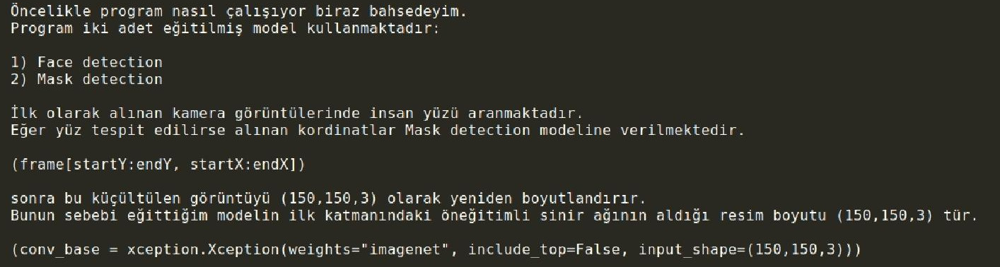

# Sonuç

In [ ]:
# Çalışmayacaktır...

image = cv2.resize(veri, (150, 150)) # tespit edilen yüzü modele dahil etmek için işliyoruz
image = image.astype("float") / 255.0
image = img_to_array(image)
image = np.expand_dims(image, axis=0)
a = model.predict(image) 
#yüz modele gönderilir çıkan sonuca göre(a ya göre) maske var(1) yada yok(0)

# çoklu sınıflandırma probleminde ise
# ynew = model.predict_classes(Xnew) yöntemi ile verinin hangi sınıfa ait olduğunu öğreniriz

#### Tespit edilen yüz modelimize yönlendirilir, çıkan sonuca göre maske var(1) yada yok(0) şeklinde sonuç alırız.

# Projenin Testi

![ChessUrl](https://www.dropbox.com/s/fkjuzh1ellt97yn/untitled.gif?dl=1 "chess")


##### mask_model_test.py adlı Python scriptini çalıştırın, gerekli modülleri ve indirmeleri yapacaktır, hata verirse kodu tekrar çalıştırın, ve sonra test :)

# Kaynaklar

### Keras documentation: https://keras.io/examples/neural_style_transfer/

### Deep Learning with Python: https://www.amazon.com/Deep-Learning-Python-FrancoisChollet/dp/1617294438

### Deep Learning: https://www.amazon.com/Deep-Learning-Adaptive-Computation-Machine/dp/0262035618

### Stanford: https://stanford.edu/~shervine/l/tr/teaching/cs-230/cheatsheet-convolutional-neural-networks

### Pyimagesearch: https://www.pyimagesearch.com/2018/12/24/how-to-use-keras-fit-and-fit_generator-a-hands-on-tutorial/ 